In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import mne
import os
from sklearn.decomposition import FastICA

from utils import divide_signal_into_trials

## Raw Signal Visualization

In [2]:
def plot_raw_eeg_signals(signal, task, subject, title=None):
    
    trial1, _, _ = divide_signal_into_trials(signal)

    # Plotting the EEG signals with vertical offsets for each channel
    plt.figure(figsize=(15, 8))
    for i in range(1, 33):  # Channels are in columns 1 to 32
        plt.plot(trial1.iloc[:, 0]/128, trial1.iloc[:, i] + i * 60, label=f'Channel {i}')
    plt.xlabel('Time (s)')
    plt.yticks(ticks=[i * 60 for i in range(1, 33)], labels=[f'Ch. {i}' for i in range(1, 33)])
    if title:
        plt.title(title)
    else:
        plt.title(f'Raw EEG Signals (32 Channels) for {task} Task - Trial 1 - Subject {subject}')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', ncol=2)
    plt.tight_layout()
    plt.show()

Plot time-series data for individual channels across trials and tasks.

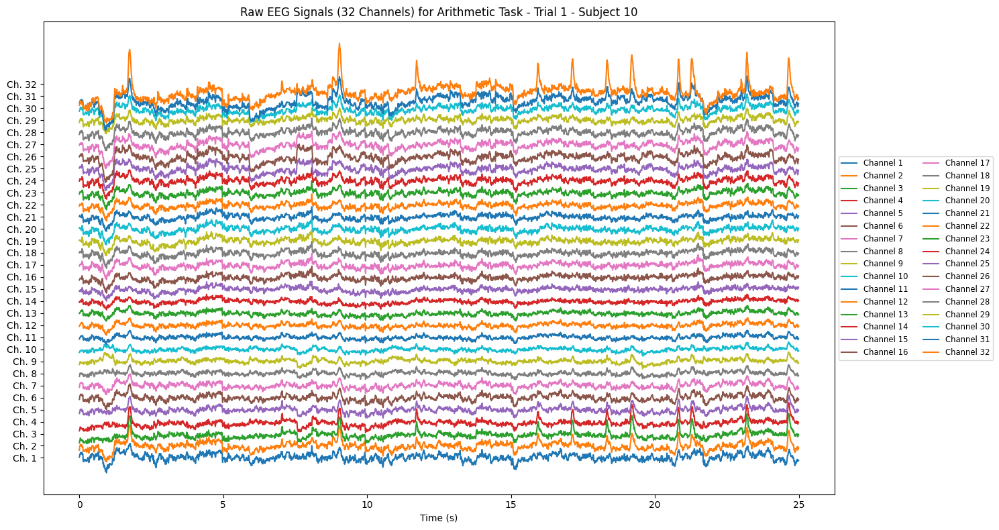

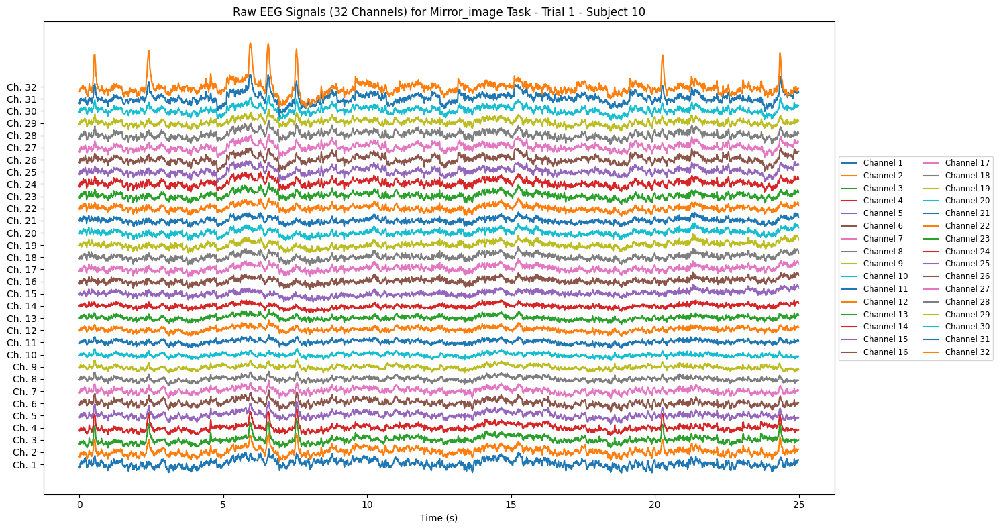

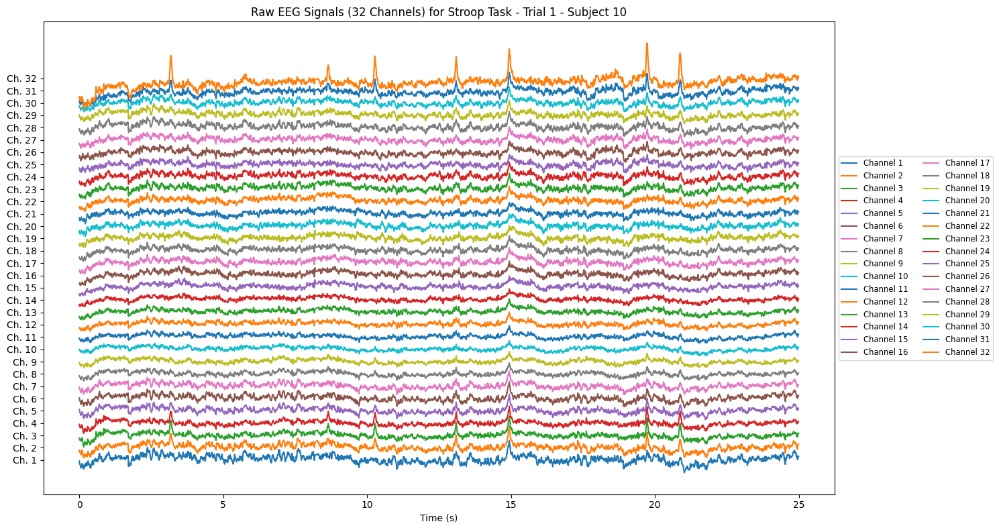

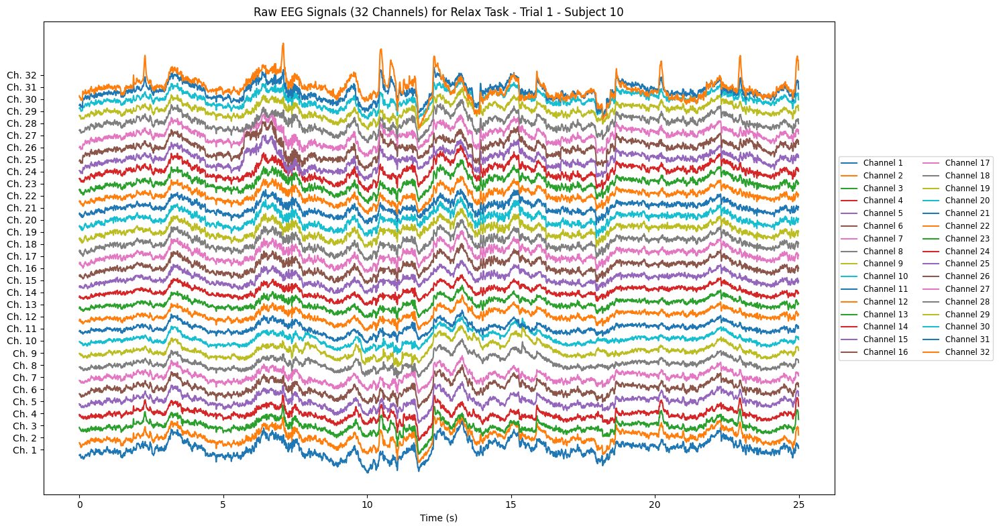

In [3]:
arithmetic = pd.read_csv(f'Data/Raw/Arithmetic/Arithmetic_sub_10.csv')
mirror_image = pd.read_csv(f'Data/Raw/Mirror_image/Mirror_image_sub_10.csv')
relax = pd.read_csv(f'Data/Raw/Relax/Relax_sub_10.csv')
stroop = pd.read_csv(f'Data/Raw/Stroop/Stroop_sub_10.csv')

plot_raw_eeg_signals(arithmetic, 'Arithmetic', 10)
plot_raw_eeg_signals(mirror_image, 'Mirror_image', 10)
plot_raw_eeg_signals(stroop, 'Stroop', 10)
plot_raw_eeg_signals(relax, 'Relax', 10)



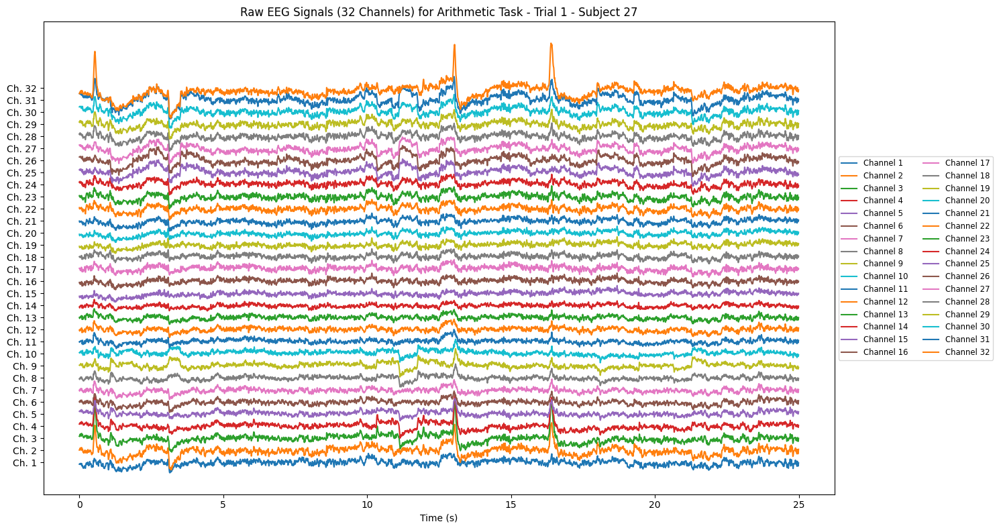

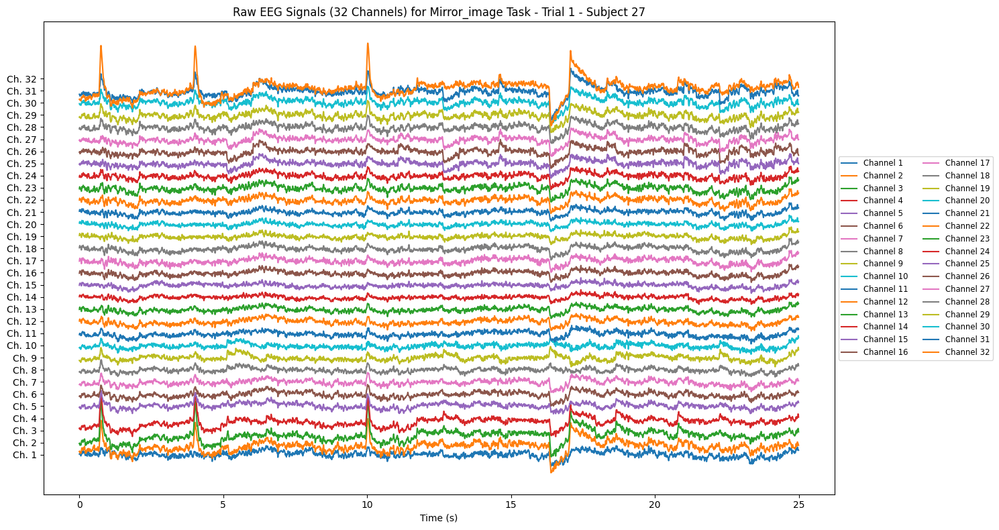

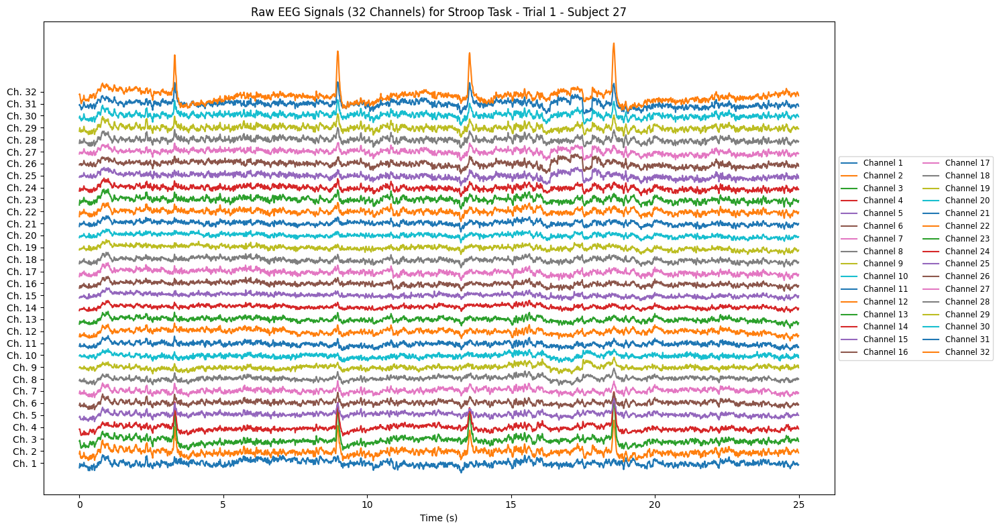

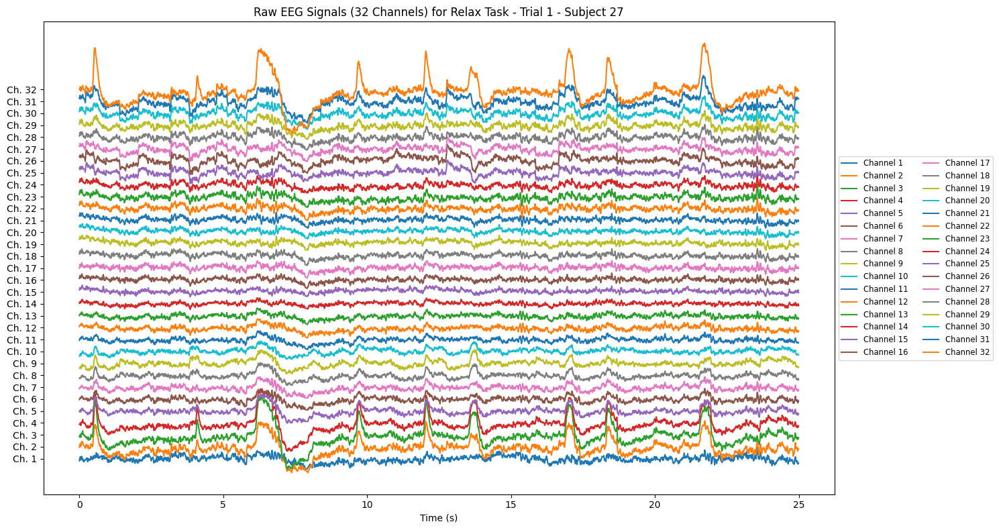

In [4]:
arithmetic = pd.read_csv(f'Data/Raw/Arithmetic/Arithmetic_sub_27.csv')
mirror_image = pd.read_csv(f'Data/Raw/Mirror_image/Mirror_image_sub_27.csv')
relax = pd.read_csv(f'Data/Raw/Relax/Relax_sub_27.csv')
stroop = pd.read_csv(f'Data/Raw/Stroop/Stroop_sub_27.csv')

plot_raw_eeg_signals(arithmetic, 'Arithmetic', 27)
plot_raw_eeg_signals(mirror_image, 'Mirror_image', 27)
plot_raw_eeg_signals(stroop, 'Stroop', 27)
plot_raw_eeg_signals(relax, 'Relax', 27)

## Data pre-processing

Apply a bandpass filter (e.g., 0.5–50 Hz) to retain EEG-relevant frequencies while removing very low-frequency drifts (DC offsets) and high-frequency noise.
Apply artifact removal methods using ICA.

In [5]:
# Define the frequency range for the bandpass filter
low_freq = 0.5
high_freq = 50.0

# Define the sampling frequency
sfreq = 128.0

# Define the base directory
base_dir = 'Data/Raw'
preprocessed_dir = 'Data/Preprocessed'

# Iterate through each activity folder
for activity in os.listdir(base_dir):
    activity_dir = os.path.join(base_dir, activity)
    preprocessed_activity_dir = os.path.join(preprocessed_dir, activity)
    
    # Iterate through each subject file in the activity folder
    for subject_file in os.listdir(activity_dir):
        file_path = os.path.join(activity_dir, subject_file)
        
        # Read the data
        signal = pd.read_csv(file_path)
        
        # Divide the signal into trials
        trial1, trial2, trial3 = divide_signal_into_trials(signal)
        
        # Process each trial
        for trial, trial_name in zip([trial1, trial2, trial3], ['trial1', 'trial2', 'trial3']):
            first_column = trial.iloc[:, 0]  # Contains the time values
            trial = trial.iloc[:, 1:]  # Contains the EEG data for 32 channels
            
            # Preprocess the data
            
            # Apply the bandpass filter
            filtered_signal = mne.filter.filter_data(trial.values.T, sfreq=sfreq, l_freq=low_freq, h_freq=high_freq, verbose=False)
            
            # Apply ICA to remove artifacts using mne
            ica = mne.preprocessing.ICA(n_components=32, random_state=97, max_iter=800)
            with mne.utils.use_log_level('error'):
                ica.fit(mne.io.RawArray(filtered_signal, mne.create_info(ch_names=[str(i) for i in range(32)], sfreq=sfreq, ch_types='eeg')), verbose=False)
                ica_signal = ica.apply(mne.io.RawArray(filtered_signal, mne.create_info(ch_names=[str(i) for i in range(32)], sfreq=sfreq, ch_types='eeg')), verbose=False).get_data().T
            
            # Convert the preprocessed signal back to a DataFrame
            preprocessed_df = pd.DataFrame(ica_signal, columns=trial.columns)
            preprocessed_df.insert(0, 'Time', first_column)
            
            # Save the filtered data
            filtered_file_path = os.path.join(preprocessed_activity_dir, f'{subject_file.split(".")[0]}_{trial_name}.csv')
            preprocessed_df.to_csv(filtered_file_path, index=False)

/var/folders/gl/css3yr3559x6r9nrv6z186zm0000gn/T/ipykernel_77061/2023385384.py:40: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(mne.io.RawArray(filtered_signal, mne.create_info(ch_names=[str(i) for i in range(32)], sfreq=sfreq, ch_types='eeg')), verbose=False)
/Users/marioroca/stess-detection-sam40/sam40/lib/python3.12/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
/var/folders/gl/css3yr3559x6r9nrv6z186zm0000gn/T/ipykernel_77061/2023385384.py:40: RuntimeWarning: Using n_components=32 (resulting in n_components_=32) may lead to an unstable mixing matrix estimation because the ratio between the largest (25) and smallest (1.1e-05) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 31
  

In [6]:
def plot_eeg_signals(signal, task, subject, title=None):

    # Plotting the EEG signals with vertical offsets for each channel
    plt.figure(figsize=(15, 8))
    for i in range(1, 33):  # Channels are in columns 1 to 32
        plt.plot(signal.iloc[:, 0]/128, signal.iloc[:, i] + i * 60, label=f'Channel {i}')
    plt.xlabel('Time (s)')
    plt.yticks(ticks=[i * 60 for i in range(1, 33)], labels=[f'Ch. {i}' for i in range(1, 33)])
    if title:
        plt.title(title)
    else:
        plt.title(f'Raw EEG Signals (32 Channels) for {task} Task - Trial 1 - Subject {subject}')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small', ncol=2)
    plt.tight_layout()
    plt.show()

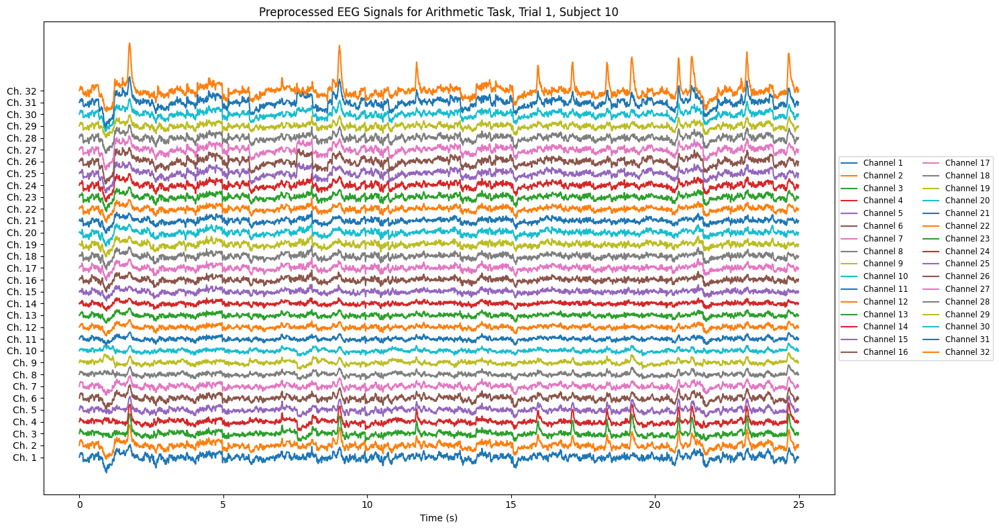

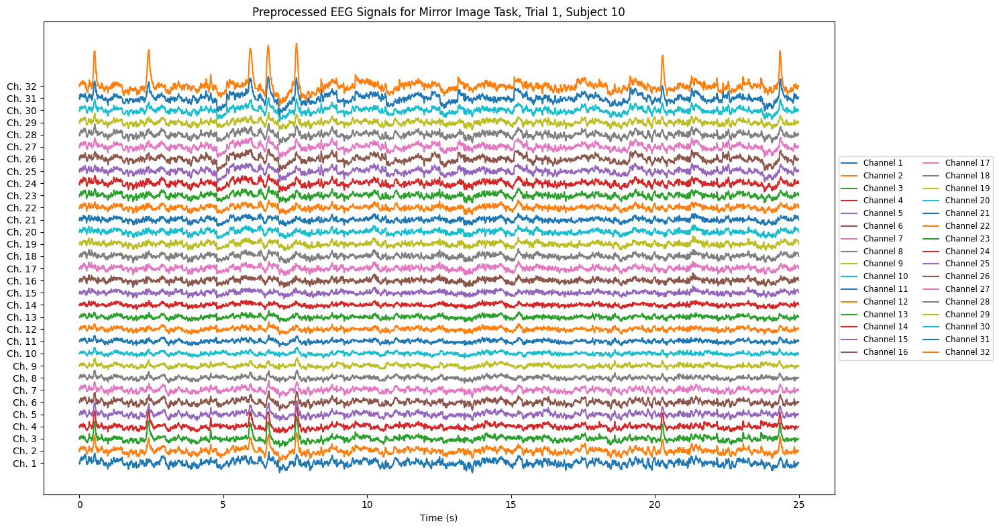

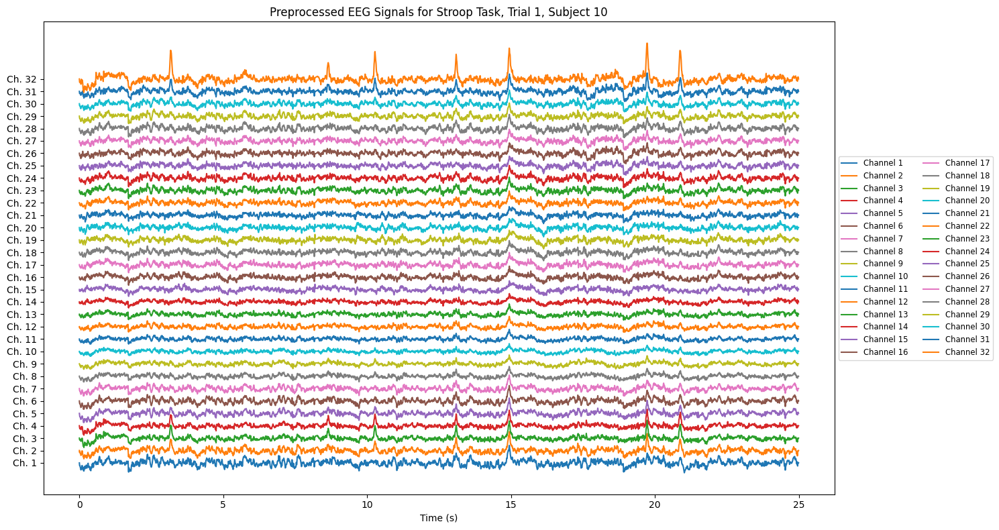

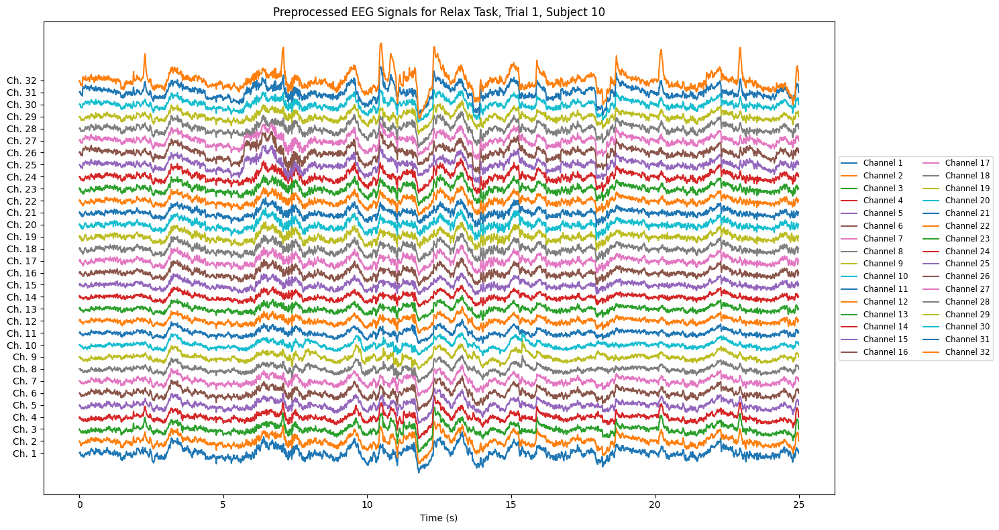

In [8]:
arithmetic = pd.read_csv(f'Data/Preprocessed/Arithmetic/Arithmetic_sub_10_trial1.csv')
mirror_image = pd.read_csv(f'Data/Preprocessed/Mirror_image/Mirror_image_sub_10_trial1.csv')
relax = pd.read_csv(f'Data/Preprocessed/Relax/Relax_sub_10_trial1.csv')
stroop = pd.read_csv(f'Data/Preprocessed/Stroop/Stroop_sub_10_trial1.csv')

plot_eeg_signals(arithmetic, 'Arithmetic', 10, 'Preprocessed EEG Signals for Arithmetic Task, Trial 1, Subject 10')
plot_eeg_signals(mirror_image, 'Mirror_image', 10, 'Preprocessed EEG Signals for Mirror Image Task, Trial 1, Subject 10')
plot_eeg_signals(stroop, 'Stroop', 10, 'Preprocessed EEG Signals for Stroop Task, Trial 1, Subject 10')
plot_eeg_signals(relax, 'Relax', 10, 'Preprocessed EEG Signals for Relax Task, Trial 1, Subject 10')